In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

%cd drive/'My Drive/ColabNotebooks/DATASET'/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: 'drive/My Drive/ColabNotebooks/DATASET/'
/content


In [ ]:
import pathlib
data_dir='/content/drive/MyDrive/Dataset'
data_dir = pathlib.Path(data_dir)

In [ ]:

image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)



928


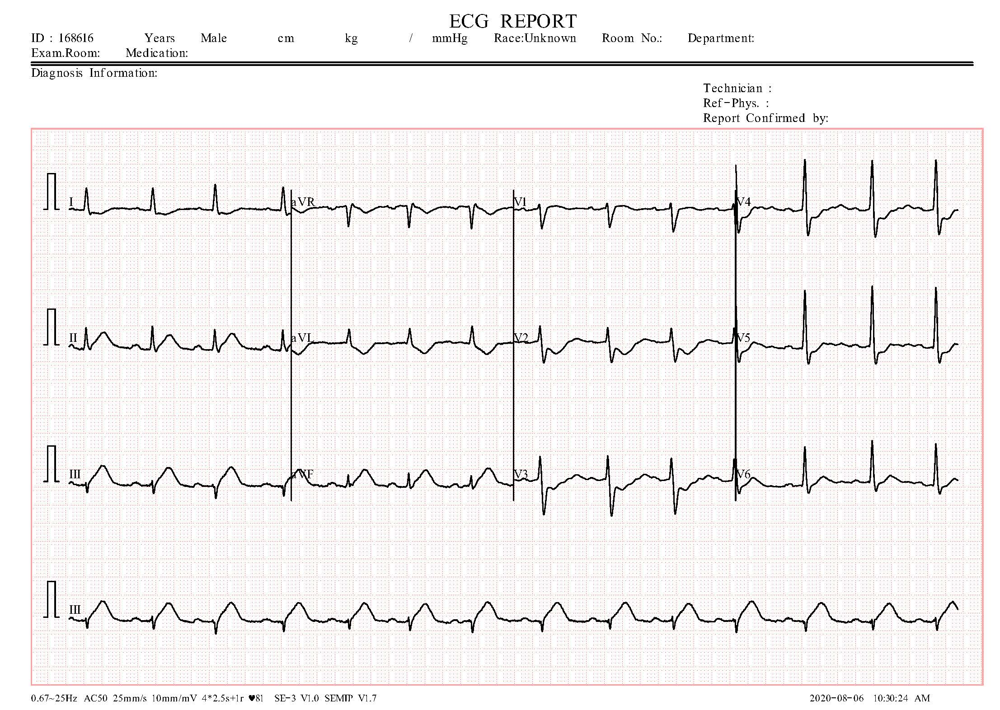

In [ ]:
ECG= list(data_dir.glob('ECG Images of Myocardial Infarction Patients (240x12=2880)/*'))
PIL.Image.open(str(ECG[0]))

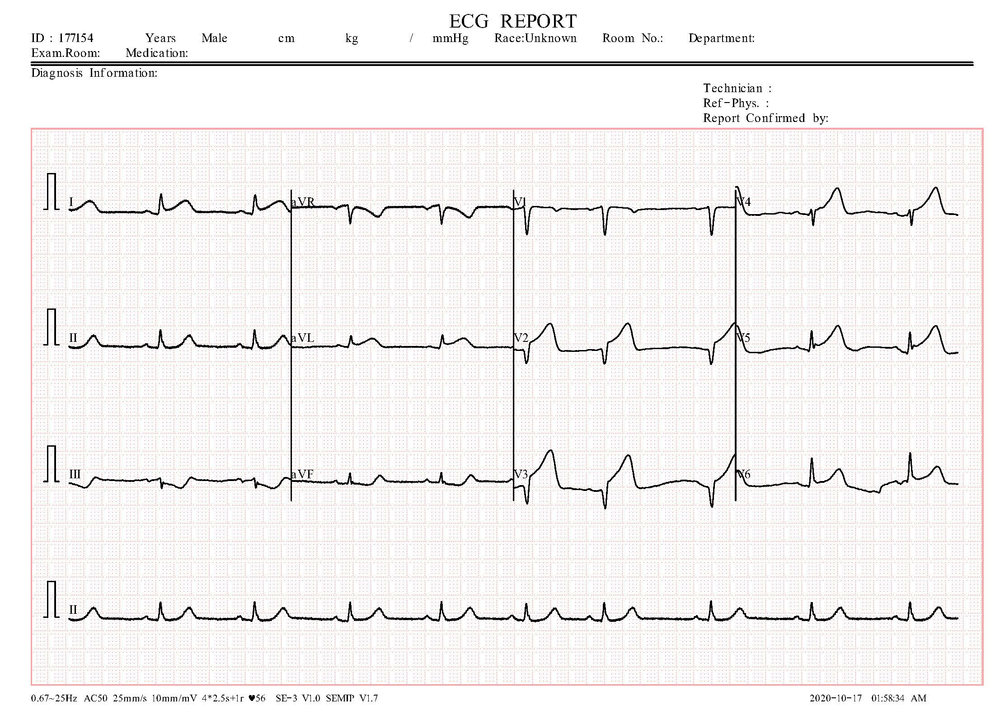

In [ ]:
PIL.Image.open(str(ECG[1]))

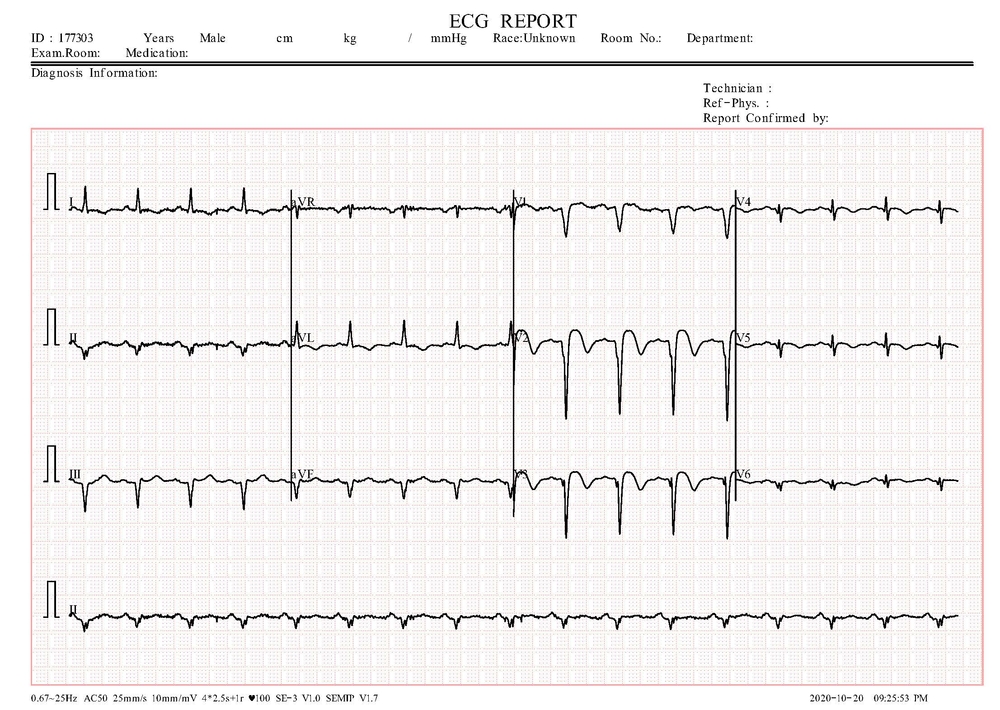

In [ ]:
HMI = list(data_dir.glob('ECG Images of Patient that have History of MI (172x12=2064)/*'))
PIL.Image.open(str(HMI[0]))

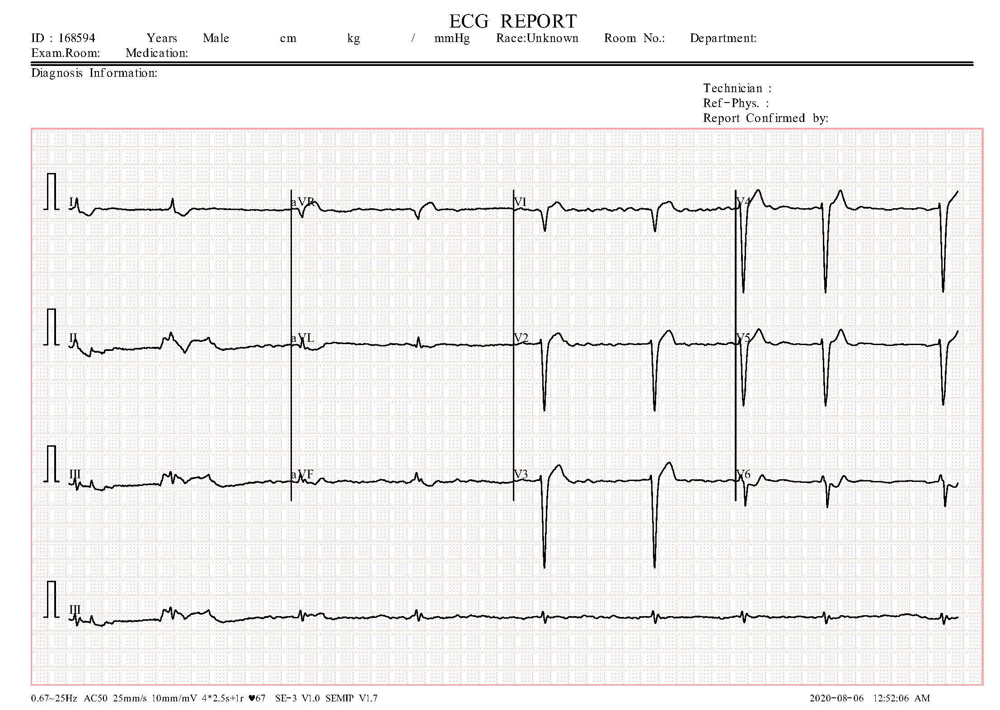

In [ ]:
PIL.Image.open(str(HMI[1]))

In [ ]:
batch_size = 32
img_height = 180
img_width = 180

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
      validation_split=0.2,
        subset="training",
          seed=123,
            image_size=(img_height, img_width),
              batch_size=batch_size)


Found 928 files belonging to 4 classes.
Using 743 files for training.


In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
      validation_split=0.2,
        subset="validation",
          seed=123,
            image_size=(img_height, img_width),
              batch_size=batch_size)


Found 928 files belonging to 4 classes.
Using 185 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['ECG Images of Myocardial Infarction Patients (240x12=2880)', 'ECG Images of Patient that have History of MI (172x12=2064)', 'ECG Images of Patient that have abnormal heartbeat (233x12=2796)', 'Normal Person ECG Images (284x12=3408)']


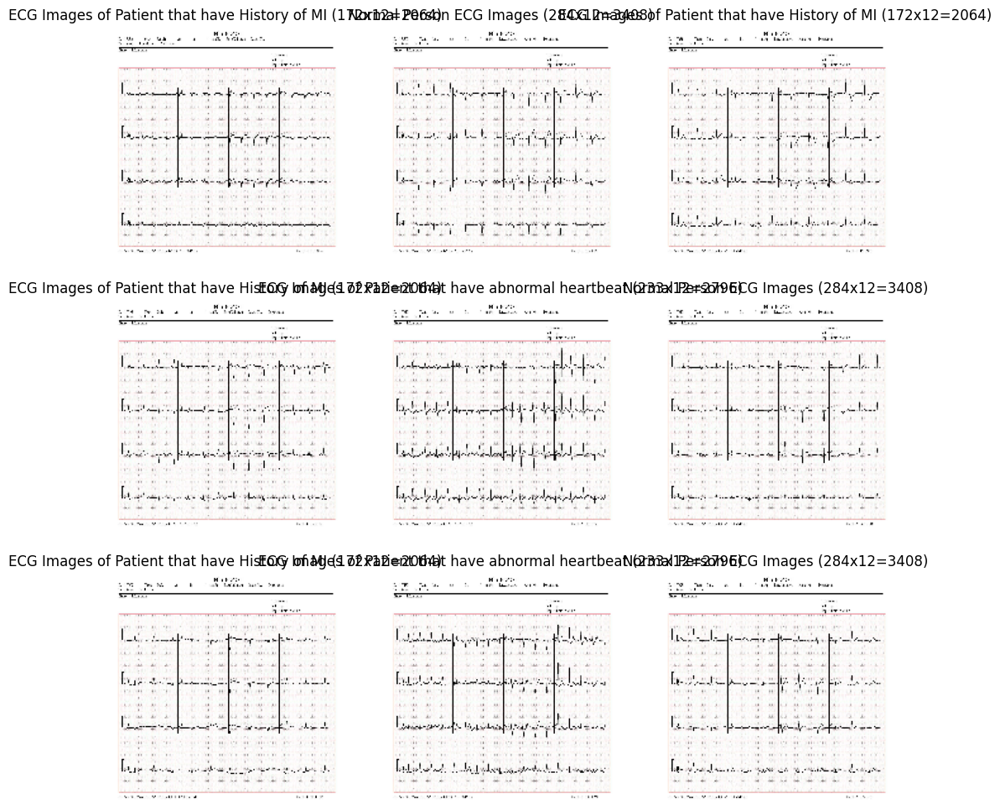

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 12))
for images, labels in train_ds.take(1):
  for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      plt.title(class_names[labels[i]])
      plt.axis("off")

In [ ]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break


(32, 180, 180, 3)
(32,)


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
normalization_layer = layers.Rescaling(1./255)

In [ ]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [ ]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
 ])

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 90, 90, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

In [ ]:
epochs=100
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/100
24/24 [==============================] - 47s 2s/step - loss: 1.7859 - accuracy: 0.2705 - val_loss: 1.3787 - val_accuracy: 0.2541
Epoch 2/100
24/24 [==============================] - 27s 1s/step - loss: 1.3719 - accuracy: 0.3190 - val_loss: 1.3866 - val_accuracy: 0.2541
Epoch 3/100
24/24 [==============================] - 27s 1s/step - loss: 1.3566 - accuracy: 0.3271 - val_loss: 1.3548 - val_accuracy: 0.3135
Epoch 4/100
24/24 [==============================] - 30s 1s/step - loss: 1.2891 - accuracy: 0.4522 - val_loss: 1.2518 - val_accuracy: 0.4865
Epoch 5/100
24/24 [==============================] - 24s 1s/step - loss: 1.0386 - accuracy: 0.6285 - val_loss: 0.8908 - val_accuracy: 0.6486
Epoch 6/100
24/24 [==============================] - 26s 1s/step - loss: 0.6532 - accuracy: 0.7645 - val_loss: 1.0105 - val_accuracy: 0.5622
Epoch 7/100
24/24 [==============================] - 27s 1s/step - loss: 0.5455 - accuracy: 0.8129 - val_loss: 0.5761 - val_accuracy: 0.8162
Epoch 8/100
2

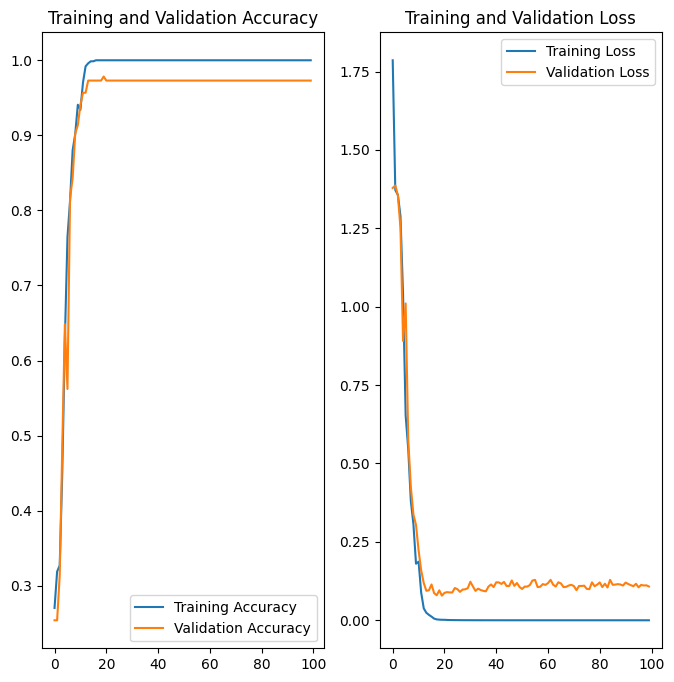

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [ ]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal",
                              input_shape=(img_height,
                                           img_width,
                                           3)),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.1),
      ]
)


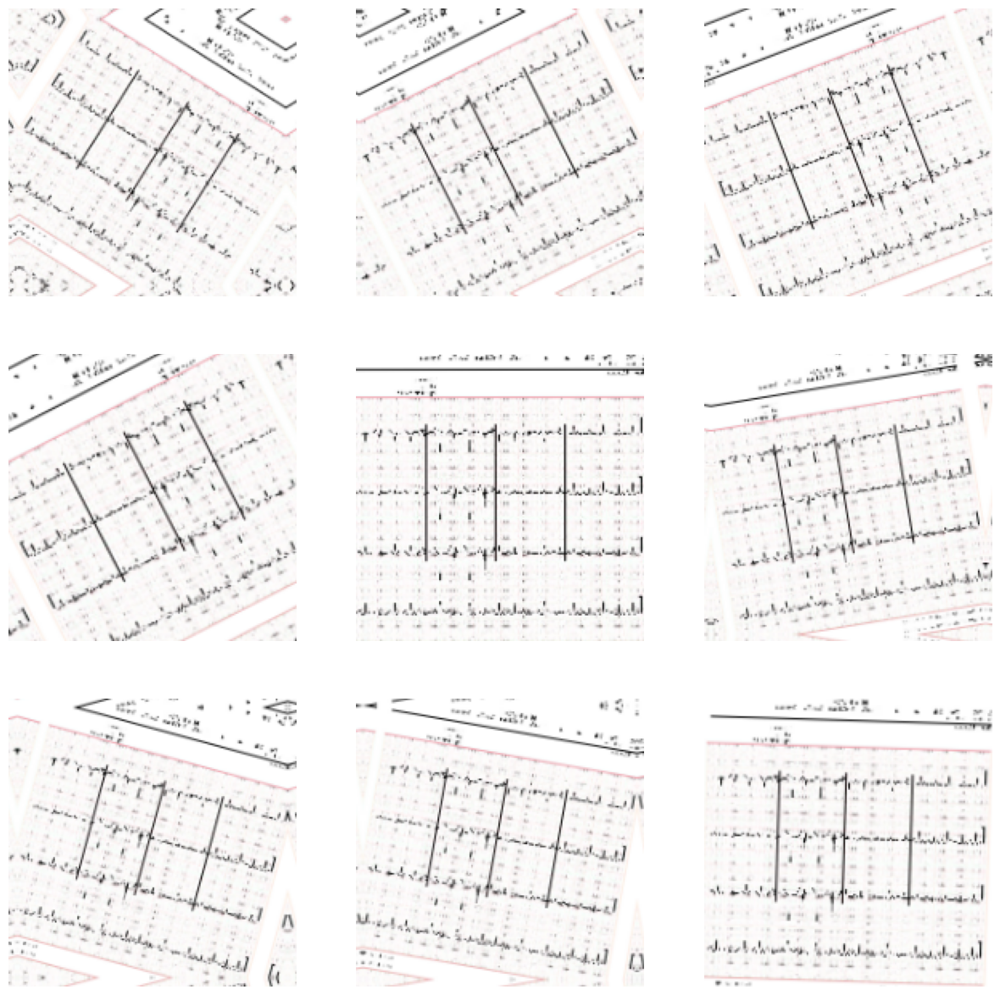

In [ ]:
plt.figure(figsize=(15, 15))
for images, _ in train_ds.take(1):
  for i in range(9):
      augmented_images = data_augmentation(images)
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(augmented_images[0].numpy().astype("uint8"))
      plt.axis("off")

In [ ]:
model = Sequential([
    data_augmentation,
    layers.Rescaling(1./255),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, name="outputs")
 ])


In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 90, 90, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 45, 45, 32)        0         
 g2D)                                                 

In [ ]:
epochs = 10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs4
)

Epoch 1/100
24/24 [==============================] - 33s 1s/step - loss: 1.7087 - accuracy: 0.2705 - val_loss: 1.3828 - val_accuracy: 0.2541
Epoch 2/100
24/24 [==============================] - 32s 1s/step - loss: 1.3774 - accuracy: 0.3190 - val_loss: 1.3885 - val_accuracy: 0.2541
Epoch 3/100
24/24 [==============================] - 31s 1s/step - loss: 1.3705 - accuracy: 0.3190 - val_loss: 1.3877 - val_accuracy: 0.2541
Epoch 4/100
24/24 [==============================] - 31s 1s/step - loss: 1.3750 - accuracy: 0.3190 - val_loss: 1.4031 - val_accuracy: 0.2541
Epoch 5/100
24/24 [==============================] - 31s 1s/step - loss: 1.3706 - accuracy: 0.3190 - val_loss: 1.3849 - val_accuracy: 0.2541
Epoch 6/100
24/24 [==============================] - 31s 1s/step - loss: 1.3730 - accuracy: 0.3190 - val_loss: 1.3851 - val_accuracy: 0.2541
Epoch 7/100
24/24 [==============================] - 31s 1s/step - loss: 1.3706 - accuracy: 0.3190 - val_loss: 1.3945 - val_accuracy: 0.2541
Epoch 8/100
2

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


In [ ]:
import tensorflow as tf
#sunflower_url = "/content/drive/MyDrive/Dataset/ECG Images of Patient that have abnormal heartbeat (233x12=2796)/HB(1).jpg"
ECG_path = '/content/drive/MyDrive/Dataset/ECG Images of Patient that have abnormal heartbeat (233x12=2796)'

img = tf.keras.utils.load_img(
ECG_path, target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
"This image most likely belongs to {} with a {:.2f} percent confidence."
.format(class_names[np.argmax(score)], 100 * np.max(score))
)

NameError: ignored

In [ ]:
# Convert the model.
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
TF_MODEL_FILE_PATH = 'model.tflite' # The default path to the saved TensorFlow Lite model

interpreter = tf.lite.Interpreter(model_path=TF_MODEL_FILE_PATH)

In [ ]:
interpreter.get_signature_list()

In [ ]:
classify_lite = interpreter.get_signature_runner('serving_default')
classify_lite

In [ ]:
predictions_lite = classify_lite(sequential_1_input=img_array)['outputs']
score_lite = tf.nn.softmax(predictions_lite)

In [ ]:
print(
      "This image most likely belongs to {} with a {:.2f} percent confidence."
       .format(class_names[np.argmax(score_lite)], 100 * np.max(score_lite))
)


In [ ]:











print(np.max(np.abs(predictions - predictions_lite)))